In [1]:
# Common
import os
import keras
import time
import shutil
import pathlib
import itertools

import numpy as np
import tensorflow as tf

# Data
from keras.preprocessing.image import ImageDataGenerator

# Data Viz
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

# Pre-Trained Models
from tensorflow.keras.applications import ResNet50, ResNet50V2, InceptionV3, Xception, ResNet152, ResNet152V2
from tensorflow.keras.applications.efficientnet import EfficientNetB5
# Model
from tensorflow.keras.models import Model

from keras import Sequential
from keras.layers import Dense, Concatenate
from keras.models import load_model
from keras.layers import Dropout
from keras.layers import GlobalAveragePooling2D,BatchNormalization
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam, Adamax

# Callbacks
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [2]:
root_path = '../input/sea-animals-image-dataste'
class_names = sorted(os.listdir(root_path))
class_names

['Clams',
 'Corals',
 'Crabs',
 'Dolphin',
 'Eel',
 'Fish',
 'Jelly Fish',
 'Lobster',
 'Nudibranchs',
 'Octopus',
 'Otter',
 'Penguin',
 'Puffers',
 'Sea Rays',
 'Sea Urchins',
 'Seahorse',
 'Seal',
 'Sharks',
 'Shrimp',
 'Squid',
 'Starfish',
 'Turtle_Tortoise',
 'Whale']

In [3]:
unwanted = {'Otter','Penguin','Turtle_Tortoise','Seal','Octopus','Eel','Lobster','Fish','Sharks','Shrimp','Whale'}
class_names = [e for e in class_names if e not in unwanted]
class_names

['Clams',
 'Corals',
 'Crabs',
 'Dolphin',
 'Jelly Fish',
 'Nudibranchs',
 'Puffers',
 'Sea Rays',
 'Sea Urchins',
 'Seahorse',
 'Squid',
 'Starfish']

In [4]:
import numpy as np
from tensorflow.keras.utils import Sequence

class TimeDistributedDataGenerator(Sequence):
    def __init__(self, data_generator, repeat, *args, **kwargs):
        self.data_generator = data_generator
        self.repeat = repeat
        self.batch_index = 0
        self.index_array = None
        super().__init__(*args, **kwargs)

    def __len__(self):
        return len(self.data_generator)

    def on_epoch_end(self):
        self.data_generator.on_epoch_end()
        self.batch_index = 0

    def __getitem__(self, index):
        if self.index_array is None:
            self.index_array = np.arange(len(self.data_generator))
        
        batch_x, batch_y = self.data_generator[index]
        
        # Repeat the batch along the time dimension
        repeated_batch_x = np.repeat(np.expand_dims(batch_x, axis=1), self.repeat, axis=1)

        return repeated_batch_x, batch_y


## Data Pre-processing and Augmentation

In [5]:
# Initialize Generator
train_val_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    horizontal_flip = True,
    width_shift_range=0.2,
    height_shift_range=0.2,
    validation_split=0.2
)

test_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)


# Load Data
train_ds = train_val_gen.flow_from_directory(root_path, target_size=(256,256), class_mode="categorical",color_mode= 'rgb', batch_size=2, shuffle=True, subset='training',classes = class_names)
valid_ds = train_val_gen.flow_from_directory(root_path, target_size=(256,256), class_mode="categorical",color_mode= 'rgb' , batch_size=2, shuffle=True, subset='validation',classes = class_names)
test_ds1 = test_gen.flow_from_directory(root_path, target_size=(256,256), class_mode="categorical",color_mode= 'rgb', batch_size=2, subset='validation',classes = class_names)

train_ds_custom = TimeDistributedDataGenerator(train_ds, repeat=2)
valid_ds_custom = TimeDistributedDataGenerator(valid_ds, repeat=2)
test_ds1_custom = TimeDistributedDataGenerator(test_ds1, repeat=2)

Found 5373 images belonging to 12 classes.
Found 1337 images belonging to 12 classes.
Found 1337 images belonging to 12 classes.


## ImproveCall

In [6]:
class MyCallback(keras.callbacks.Callback):
    def __init__(self, model, patience, stop_patience, threshold, factor, batches, epochs, ask_epoch):
        super(MyCallback, self).__init__()
        self.model = model
        self.patience = patience # specifies how many epochs without improvement before learning rate is adjusted
        self.stop_patience = stop_patience # specifies how many times to adjust lr without improvement to stop training
        self.threshold = threshold # specifies training accuracy threshold when lr will be adjusted based on validation loss
        self.factor = factor # factor by which to reduce the learning rate
        self.batches = batches # number of training batch to run per epoch
        self.epochs = epochs
        self.ask_epoch = ask_epoch
        self.ask_epoch_initial = ask_epoch # save this value to restore if restarting training

        # callback variables
        self.count = 0 # how many times lr has been reduced without improvement
        self.stop_count = 0
        self.best_epoch = 1   # epoch with the lowest loss
        self.initial_lr = float(tf.keras.backend.get_value(model.optimizer.lr)) # get the initial learning rate and save it
        self.highest_tracc = 0.0 # set highest training accuracy to 0 initially
        self.lowest_vloss = np.inf # set lowest validation loss to infinity initially
        self.best_weights = self.model.get_weights() # set best weights to model's initial weights
        self.initial_weights = self.model.get_weights()   # save initial weights if they have to get restored

    # Define a function that will run when train begins
    def on_train_begin(self, logs= None):
        msg = 'Do you want model asks you to halt the training [y/n] ?'
        print(msg)
        ans = input('')
        if ans in ['Y', 'y']:
            self.ask_permission = 1
        elif ans in ['N', 'n']:
            self.ask_permission = 0

        msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
        print(msg)
        self.start_time = time.time()


    def on_train_end(self, logs= None):
        stop_time = time.time()
        tr_duration = stop_time - self.start_time
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg)

        # set the weights of the model to the best weights
        self.model.set_weights(self.best_weights)


    def on_train_batch_end(self, batch, logs= None):
        # get batch accuracy and loss
        acc = logs.get('accuracy') * 100
        loss = logs.get('loss')

        # prints over on the same line to show running batch count
        msg = '{0:20s}processing batch {1:} of {2:5s}-   accuracy=  {3:5.3f}   -   loss: {4:8.5f}'.format(' ', str(batch), str(self.batches), acc, loss)
        print(msg, '\r', end= '')


    def on_epoch_begin(self, epoch, logs= None):
        self.ep_start = time.time()


    # Define method runs on the end of each epoch
    def on_epoch_end(self, epoch, logs= None):
        ep_end = time.time()
        duration = ep_end - self.ep_start

        lr = float(tf.keras.backend.get_value(self.model.optimizer.lr)) # get the current learning rate
        current_lr = lr
        acc = logs.get('accuracy')  # get training accuracy
        v_acc = logs.get('val_accuracy')  # get validation accuracy
        loss = logs.get('loss')  # get training loss for this epoch
        v_loss = logs.get('val_loss')  # get the validation loss for this epoch

        if acc < self.threshold: # if training accuracy is below threshold adjust lr based on training accuracy
            monitor = 'accuracy'
            if epoch == 0:
                pimprov = 0.0
            else:
                if(self.highest_tracc == 0):
                    self.highest_tracc = 0.001
                pimprov = (acc - self.highest_tracc ) * 100 / self.highest_tracc # define improvement of model progres

            if acc > self.highest_tracc: # training accuracy improved in the epoch
                self.highest_tracc = acc # set new highest training accuracy
                self.best_weights = self.model.get_weights() # training accuracy improved so save the weights
                self.count = 0 # set count to 0 since training accuracy improved
                self.stop_count = 0 # set stop counter to 0
                if v_loss < self.lowest_vloss:
                    self.lowest_vloss = v_loss
                self.best_epoch = epoch + 1  # set the value of best epoch for this epoch

            else:
                # training accuracy did not improve check if this has happened for patience number of epochs
                # if so adjust learning rate
                if self.count >= self.patience - 1: # lr should be adjusted
                    lr = lr * self.factor # adjust the learning by factor
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr) # set the learning rate in the optimizer
                    self.count = 0 # reset the count to 0
                    self.stop_count = self.stop_count + 1 # count the number of consecutive lr adjustments
                    self.count = 0 # reset counter
                    if v_loss < self.lowest_vloss:
                        self.lowest_vloss = v_loss
                else:
                    self.count = self.count + 1 # increment patience counter

        else: # training accuracy is above threshold so adjust learning rate based on validation loss
            monitor = 'val_loss'
            if epoch == 0:
                pimprov = 0.0

            else:
                pimprov = (self.lowest_vloss - v_loss ) * 100 / self.lowest_vloss

            if v_loss < self.lowest_vloss: # check if the validation loss improved
                self.lowest_vloss = v_loss # replace lowest validation loss with new validation loss
                self.best_weights = self.model.get_weights() # validation loss improved so save the weights
                self.count = 0 # reset count since validation loss improved
                self.stop_count = 0
                self.best_epoch = epoch + 1 # set the value of the best epoch to this epoch

            else: # validation loss did not improve
                if self.count >= self.patience - 1: # need to adjust lr
                    lr = lr * self.factor # adjust the learning rate
                    self.stop_count = self.stop_count + 1 # increment stop counter because lr was adjusted
                    self.count = 0 # reset counter
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr) # set the learning rate in the optimizer

                else:
                    self.count = self.count + 1 # increment the patience counter

                if acc > self.highest_tracc:
                    self.highest_tracc = acc

        msg = f'{str(epoch + 1):^3s}/{str(self.epochs):4s} {loss:^9.3f}{acc * 100:^9.3f}{v_loss:^9.5f}{v_acc * 100:^9.3f}{current_lr:^9.5f}{lr:^9.5f}{monitor:^11s}{pimprov:^10.2f}{duration:^8.2f}'
        print(msg)

        if self.stop_count > self.stop_patience - 1: # check if learning rate has been adjusted stop_count times with no improvement
            msg = f' training has been halted at epoch {epoch + 1} after {self.stop_patience} adjustments of learning rate with no improvement'
            print(msg)
            self.model.stop_training = True # stop training

        else:
            if self.ask_epoch != None and self.ask_permission != 0:
                if epoch + 1 >= self.ask_epoch:
                    msg = 'enter H to halt training or an integer for number of epochs to run then ask again'
                    print(msg)

                    ans = input('')
                    if ans == 'H' or ans == 'h':
                        msg = f'training has been halted at epoch {epoch + 1} due to user input'
                        print(msg)
                        self.model.stop_training = True # stop training

                    else:
                        try:
                            ans = int(ans)
                            self.ask_epoch += ans
                            msg = f' training will continue until epoch {str(self.ask_epoch)}'
                            print(msg)
                            msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor', '% Improv', 'Duration')
                            print(msg)

                        except Exception:
                            print('Invalid')
                            

In [7]:
from tensorflow.keras.layers import Dense, Dropout, Input, GlobalAveragePooling2D, Average, TimeDistributed, Average, Flatten

# Load pre-trained models
EfficentB5 = load_model('/kaggle/input/enhancement-model/EfficentB5_best.h5', compile=False)
InceptionV3 = load_model('/kaggle/input/enhancement-model/InceptionV3_best.h5', compile=False)
EfficentB5.trainable = False
InceptionV3.trainable = False

inputs = Input(shape=(2, 256, 256, 3))

InceptionV3_features = TimeDistributed(InceptionV3)(inputs)
InceptionV3_features = TimeDistributed(tf.keras.layers.LayerNormalization())(InceptionV3_features)
InceptionV3_features = Flatten()(InceptionV3_features)
InceptionV3_features = Dense(512)(InceptionV3_features)

EfficentB5_features = TimeDistributed(EfficentB5)(inputs)
#EfficentB5_features = TimeDistributed(GlobalAveragePooling2D())(EfficentB5_features)
EfficentB5_features = Flatten()(EfficentB5_features)
EfficentB5_features = Dense(1024)(EfficentB5_features)
EfficentB5_features = Dense(512)(EfficentB5_features)

averaged_features = Average()([EfficentB5_features, InceptionV3_features])

x = BatchNormalization(axis= -1, momentum= 0.99, epsilon= 0.001)(averaged_features)
x =  Dense(256, kernel_regularizer= regularizers.l2(l= 0.016), activity_regularizer= regularizers.l1(0.006),
                bias_regularizer= regularizers.l1(0.006), activation= 'elu')(x)
x = Dropout(rate= 0.45, seed= 123)(x)
    
outputs = Dense(len(class_names), activation= 'softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 2, 256, 256, 3)]     0         []                            
                                                                                                  
 time_distributed_2 (TimeDi  (None, 2, 12)                2904934   ['input_1[0][0]']             
 stributed)                                               7                                       
                                                                                                  
 time_distributed (TimeDist  (None, 2, 12)                2233860   ['input_1[0][0]']             
 ributed)                                                 4                                       
                                                                                              

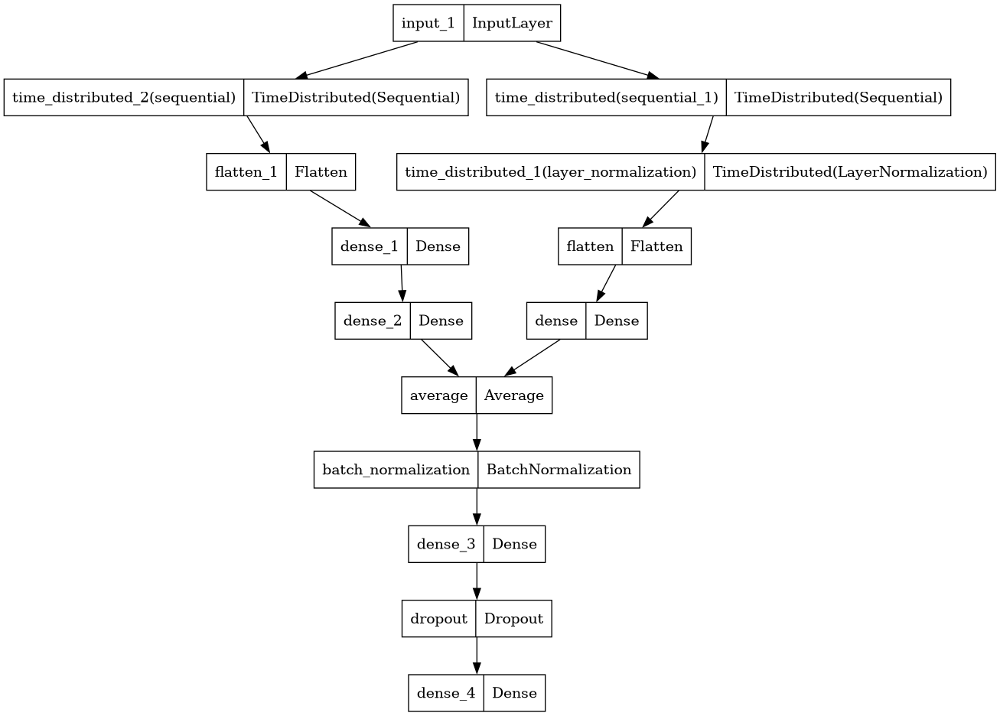

In [8]:
tf.keras.utils.plot_model(model)

In [9]:
from datetime import datetime


In [10]:
name = "Combined_best"
batch_size = 40   # set batch size for training
epochs = 5   # number of all epochs in training
patience = 2   #number of epochs to wait to adjust lr if monitored value does not improve
stop_patience = 3   # number of epochs to wait before stopping training if monitored value does not improve
threshold = 0.94   # if train accuracy is < threshold adjust monitor accuracy, else monitor validation loss
factor = 0.25   # factor to reduce lr by
ask_epoch = 2   # number of epochs to run before asking if you want to halt training
batches = int(np.ceil(len(train_ds) / batch_size))    # number of training batch to run per epoch


In [11]:
model_save_folder = datetime.now().strftime("%Y%m%d_%H%M%S")
model_save_dir = f'models/{model_save_folder}'

if not os.path.exists(model_save_dir):
  print("FOLDER CREATED")
  os.makedirs(model_save_dir)

save_model_checkpoint = ModelCheckpoint(model_save_dir+'/model-{epoch:03d}.hdf5',monitor='val_acc',save_best_only=False,mode='auto')

callbacks = [MyCallback(model= model, patience= patience, stop_patience= stop_patience, threshold= threshold,
            factor= factor, batches= batches, epochs= epochs, ask_epoch= ask_epoch ),save_model_checkpoint]

FOLDER CREATED


In [12]:
tf.config.run_functions_eagerly(True)

In [13]:
# Trained Model loaded from folder
model.load_weights('/kaggle/working/models/20240227_110604/model-001.hdf5')

# model.fit(train_ds_custom,epochs= epochs, verbose= 0, callbacks= callbacks,
#                     validation_data= valid_ds_custom, steps_per_epoch=len(train_ds),
#     validation_steps=len(valid_ds), shuffle= False)

In [15]:
# model.evaluate(test_ds1_custom)

In [16]:
# model.evaluate(valid_ds_custom)

## UWE Enhancement model

In [17]:
from keras.models import load_model
enhance_model = tf.keras.models.load_model('/kaggle/input/enhancement-model/UWE-NET_UNDWERWATER (3).h5',compile=False)

In [18]:
enhanced_images = []
labels = []

for i in range(len(test_ds1)):
    batch_images, batch_labels = test_ds1[i]
    
    # Apply the enhancement model to the batch of images
    enhanced_batch = enhance_model.predict(batch_images)
    
    # Append the enhanced images and labels
    enhanced_images.append(enhanced_batch)
    labels.append(batch_labels)

# Concatenate the enhanced images and labels
enhanced_images = np.concatenate(enhanced_images)
labels = np.concatenate(labels)

# Step 3: Create a new dataset (enhanced_test_ds) for evaluation
enhanced_test_ds = (enhanced_images, labels)

1/1 [==============================] - 1s 1s/step


In [19]:
class TimeDistributedDataGenerator2(Sequence):
    def __init__(self, enhanced_images, labels, repeat, batch_size):
        self.enhanced_images = enhanced_images
        self.labels = labels
        self.repeat = repeat
        self.batch_size = batch_size
        self.index_array = np.arange(len(enhanced_images))
        super().__init__()

    def __len__(self):
        return int(np.ceil(len(self.enhanced_images) / self.batch_size))

    def __getitem__(self, index):
        start = index * self.batch_size
        end = (index + 1) * self.batch_size

        batch_images = self.enhanced_images[start:end]
        batch_labels = self.labels[start:end]

        repeated_batch_images = np.repeat(np.expand_dims(batch_images, axis=1), self.repeat, axis=1)

        return repeated_batch_images, batch_labels

## Testing sample images with and without the UWE enhancement

In [22]:
def show_image2(enhance,img, title=None):
    
    fig = plt.figure(figsize=(8, 4))
    
    # Without Enhancement
    ax = fig.add_subplot(1, 2, 1)
    ax.set_title('Without Enhancement', loc='left', fontstyle='oblique', fontsize='medium')
    plt.imshow(img[0])  # Plot the i-th image in the sequence
    plt.axis('off')

        # With Enhancement
    ax = fig.add_subplot(1, 2, 2)
    ax.set_title('With Enhancement', loc='left', fontstyle='oblique', fontsize='medium')
    plt.imshow(enhance[0])  # Plot the i-th enhanced image in the sequence
    plt.axis('off')

    plt.suptitle(title,fontstyle='oblique', fontsize='medium')
    plt.show()

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

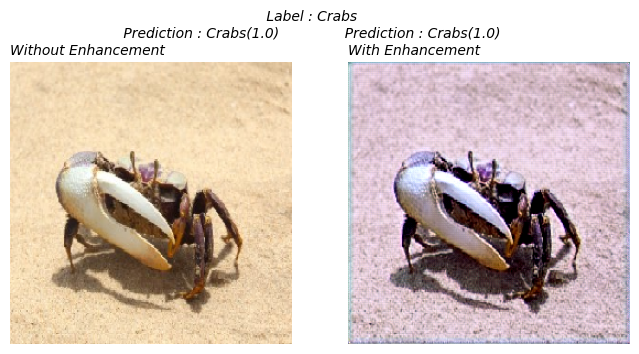

1/1 [==============================] - 1s 1s/step


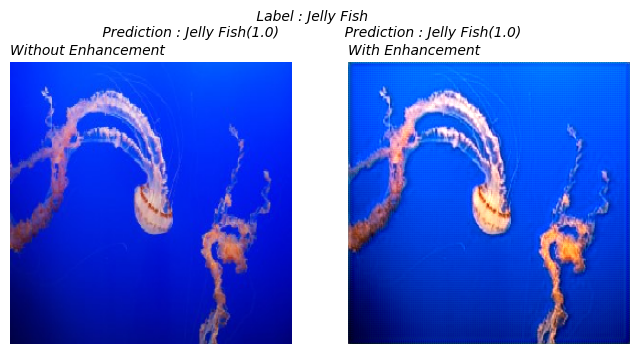

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

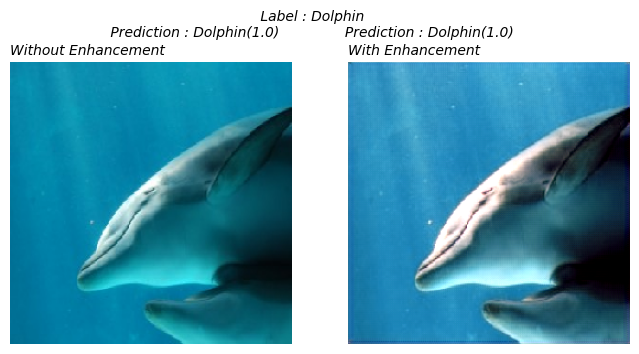

1/1 [==============================] - 1s 1s/step


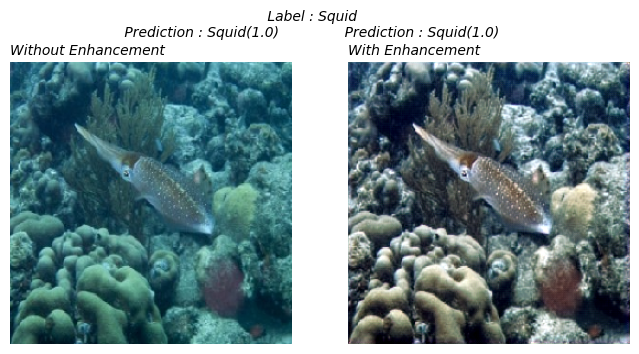

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

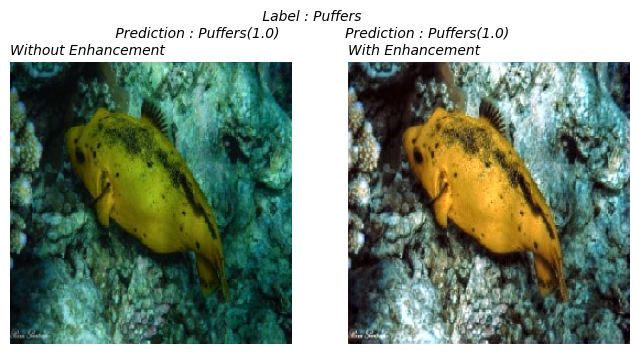

1/1 [==============================] - 1s 1s/step


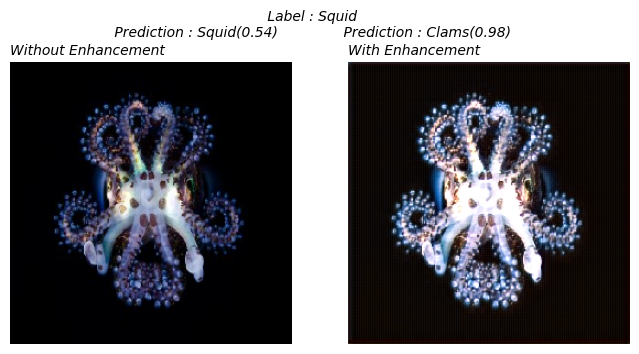

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

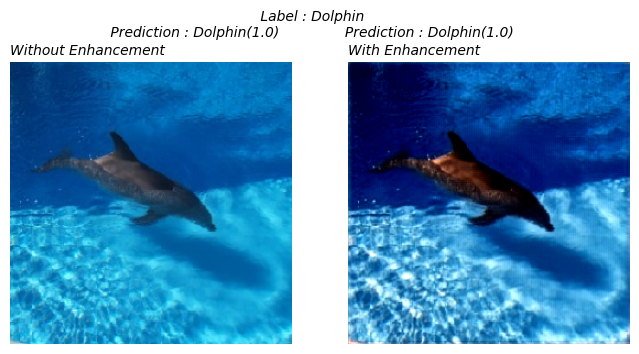

1/1 [==============================] - 1s 1s/step


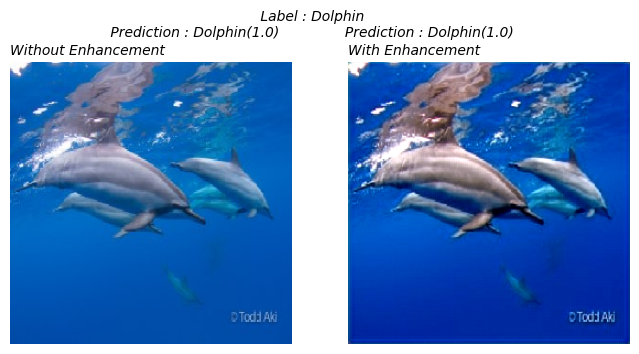

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

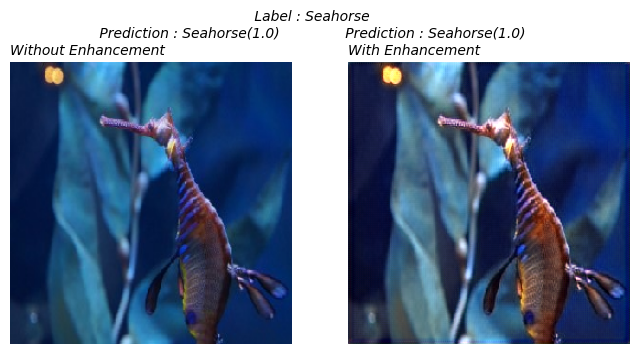

1/1 [==============================] - 1s 1s/step


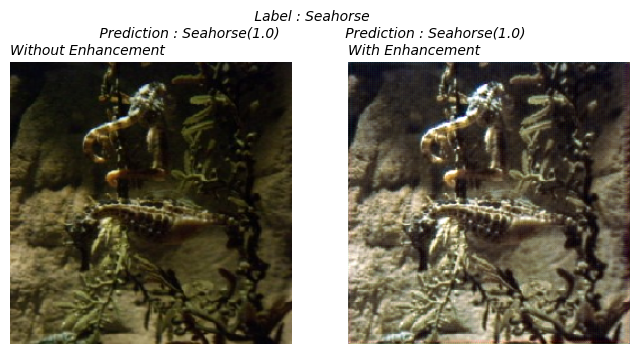

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

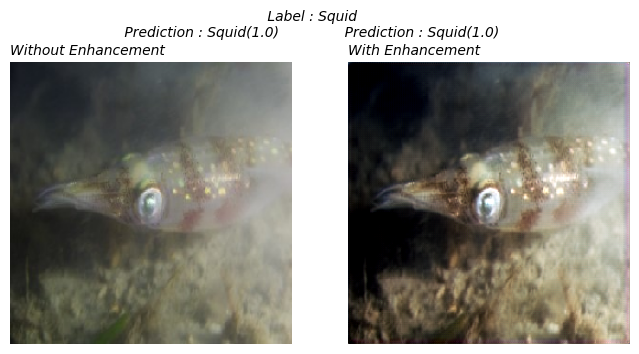

1/1 [==============================] - 1s 1s/step


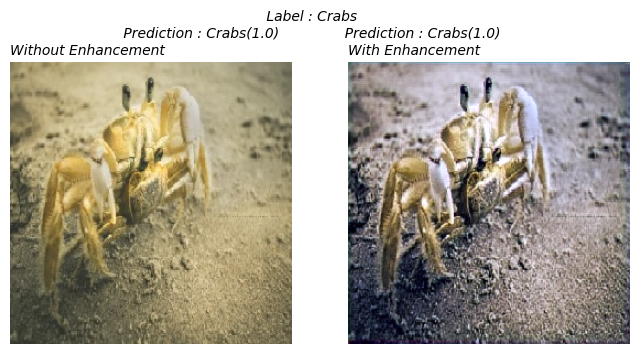

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

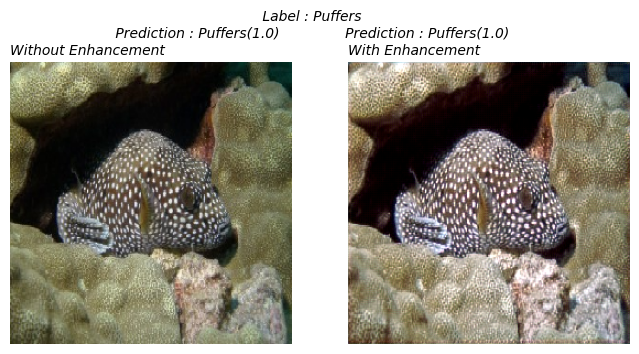

1/1 [==============================] - 1s 1s/step


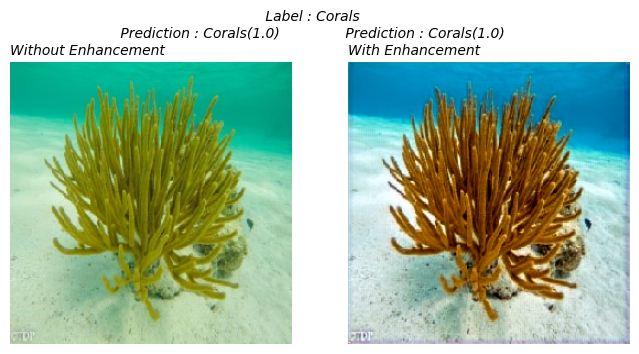

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

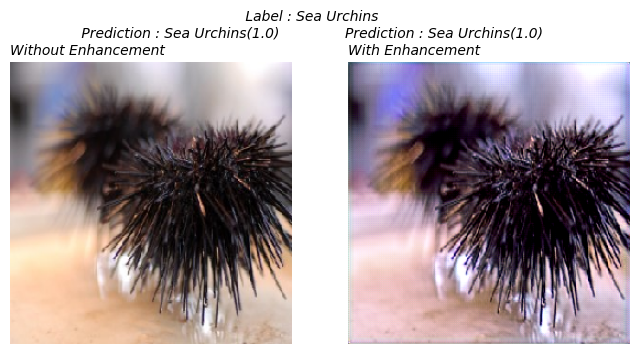

1/1 [==============================] - 1s 1s/step


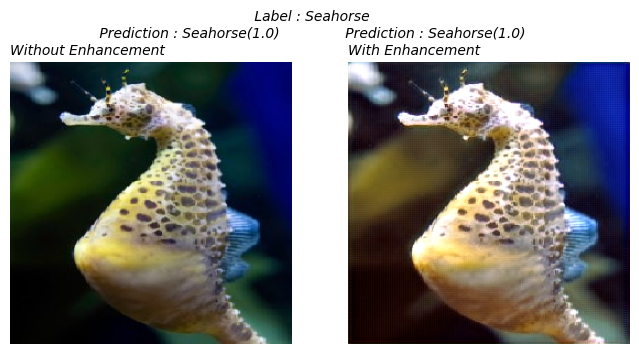

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

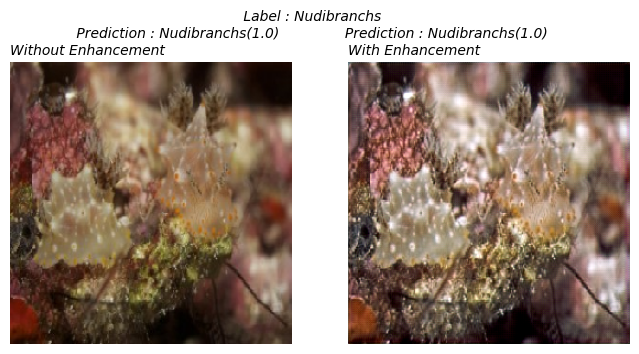

1/1 [==============================] - 1s 1s/step


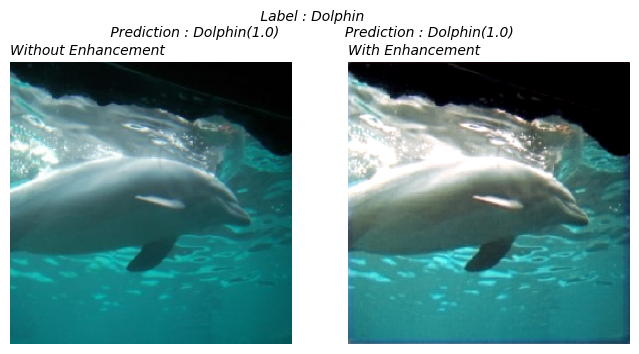

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

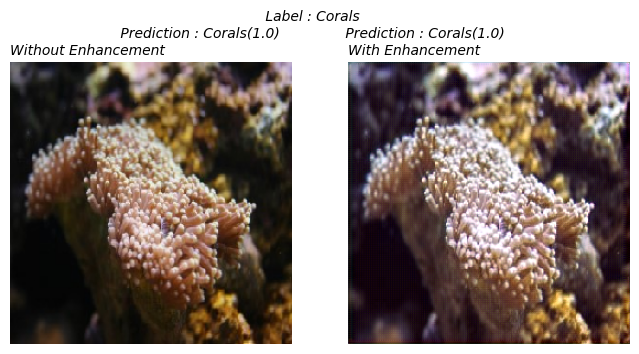

1/1 [==============================] - 1s 1s/step


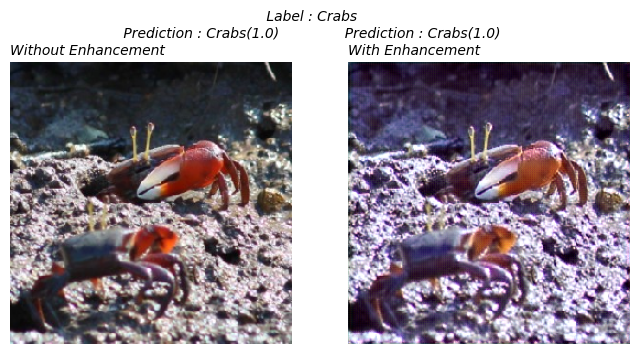

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

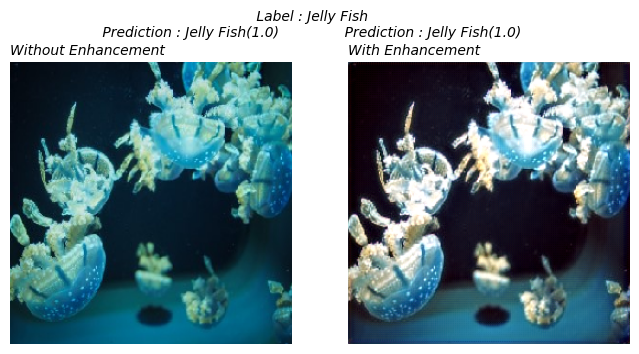

1/1 [==============================] - 1s 1s/step


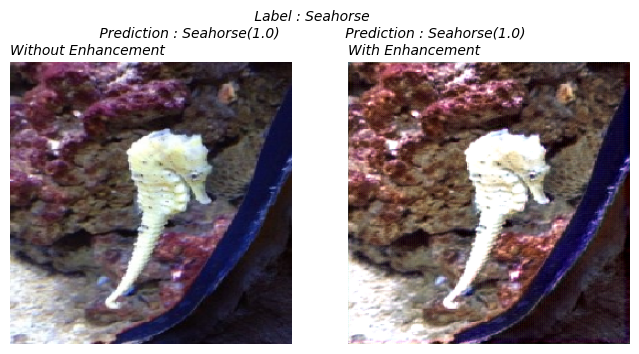

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

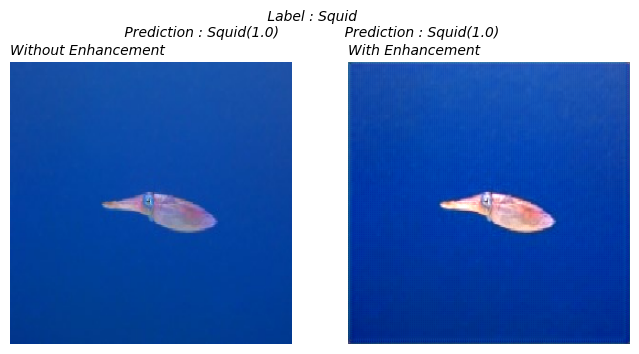

1/1 [==============================] - 1s 1s/step


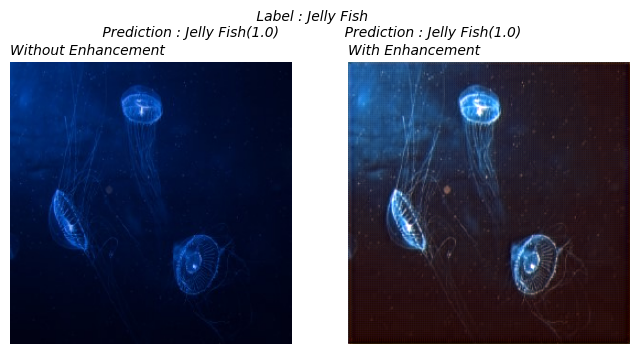

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

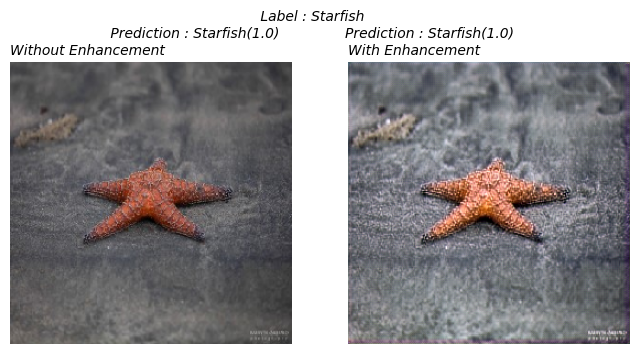

1/1 [==============================] - 1s 1s/step


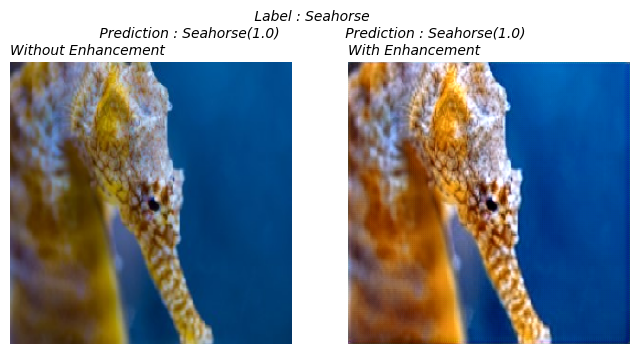

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

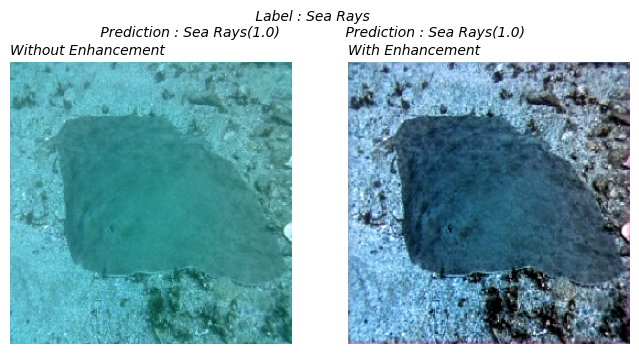

1/1 [==============================] - 1s 1s/step


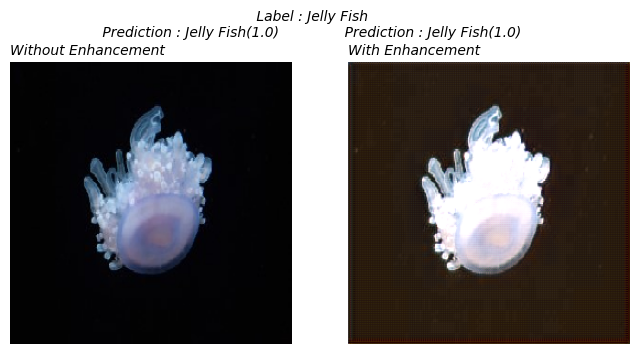

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

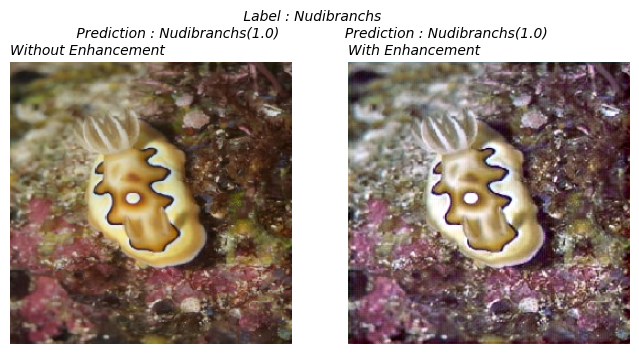

1/1 [==============================] - 1s 1s/step


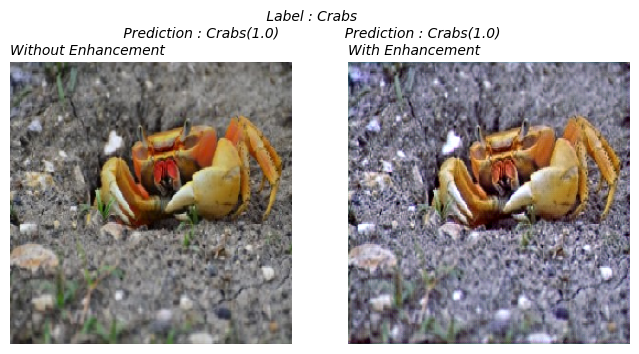

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

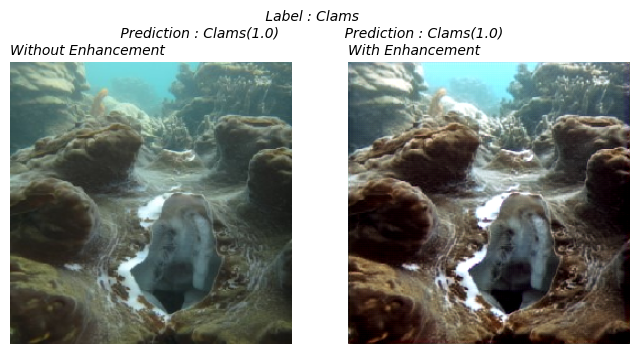

1/1 [==============================] - 1s 1s/step


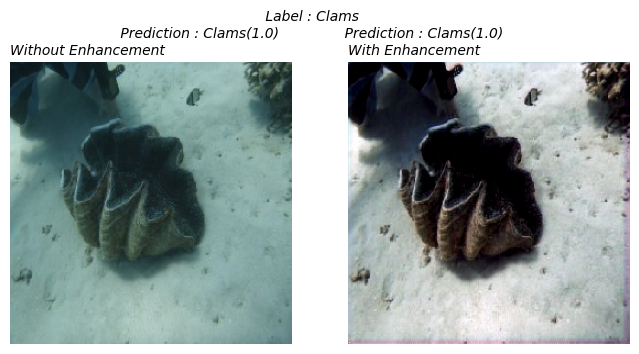

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

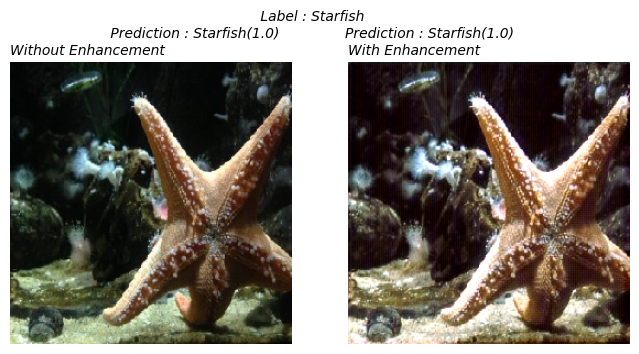

1/1 [==============================] - 1s 1s/step


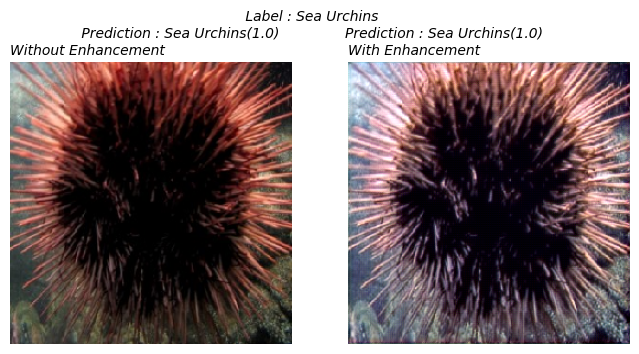

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

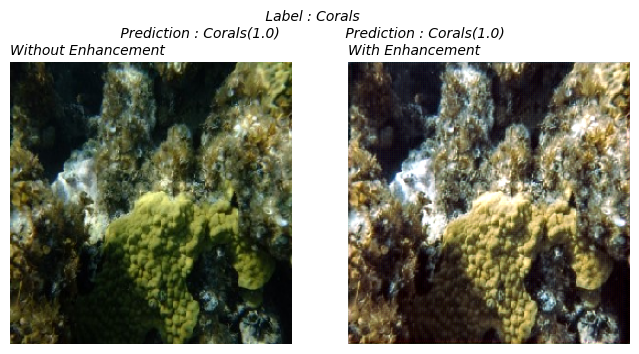

1/1 [==============================] - 1s 1s/step


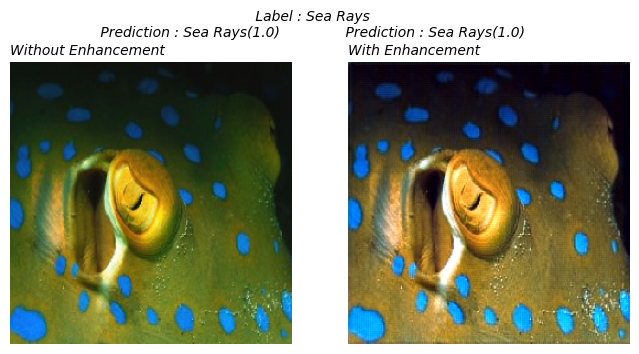

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

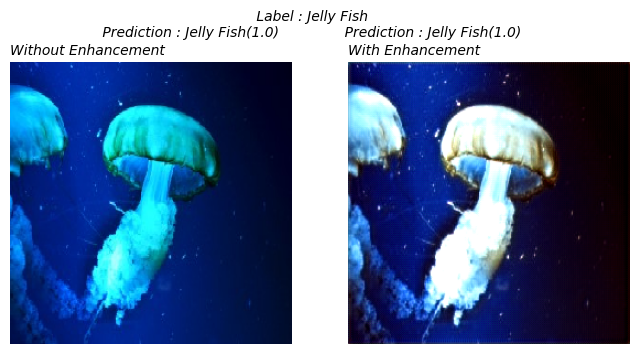

1/1 [==============================] - 1s 1s/step


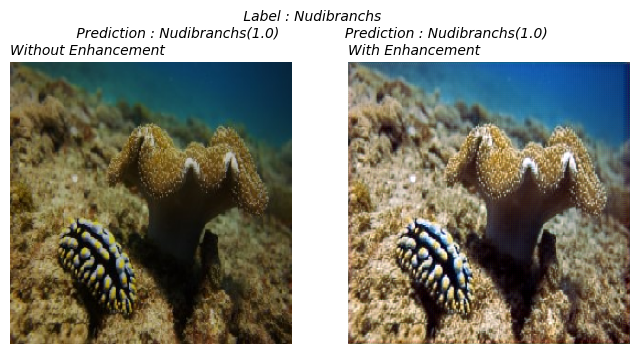

1/1 [==============================] - 1s 1s/step


<Figure size 3000x3500 with 0 Axes>

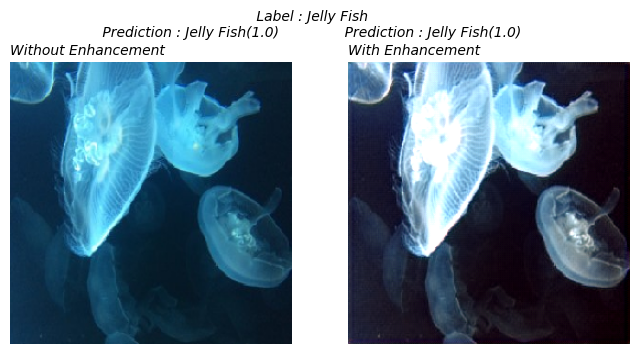

1/1 [==============================] - 1s 1s/step


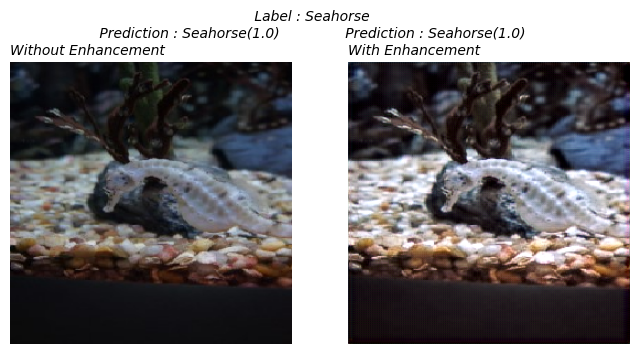

In [23]:
for i in range(40,60):
    images, labels = test_ds1_custom[i-1]
    
    plt.figure(figsize=(30,35))
    for i in range(1,len(test_ds1_custom[2][1])+1):
        image = images[i-1]
        label = labels[i-1]
        label = np.argmax(label, axis=-1)
        lab_name = class_names[int(label)]

        #With Enhancement
        enhance = enhance_model.predict(image, verbose=0)
        enhance = np.squeeze(enhance)

        proba = model.predict(image[np.newaxis,...])
        pred = class_names[np.argmax(proba)]
        max_proba = float(max(proba[0])) 

        proba1 = model.predict(enhance[np.newaxis,...])
        pred1 = class_names[np.argmax(proba1)]
        max_proba1 = float(max(proba1[0]))
    #     plt.subplot(11,3,i)

        show_image2(enhance,image, title=f" Label : {lab_name}\n Prediction : {pred}({np.round(max_proba,2)})               Prediction : {pred1}({np.round(max_proba1,2)})")
    # plt.tight_layout()
    plt.show()


In [24]:
from sklearn.metrics import classification_report

# Assuming you have the ground truth labels for both enhanced and non-enhanced data
y_true_non_enhanced = []  # Replace with your actual non-enhanced ground truth labels
y_true_enhanced = []  # Replace with your actual enhanced ground truth labels

# Assuming you have predictions for both enhanced and non-enhanced data
y_pred_non_enhanced = []  # Replace with your actual non-enhanced predictions
y_pred_enhanced = []  # Replace with your actual enhanced predictions

# Loop through your data and predictions to populate the true labels
for j in range(0,len(test_ds1_custom)):
    images, labels = test_ds1_custom[j]
    for i in range(0,len(images)):
        image = images[i]
        label = labels[i]

        # Non-enhanced data
        y_true_non_enhanced.append(np.argmax(label, axis=-1))  

        # Predictions for non-enhanced data
        pred_non_enhanced = model.predict(image[np.newaxis,...])
        y_pred_non_enhanced.extend(np.argmax(pred_non_enhanced, axis=-1))

        # Enhanced data
        enhanced_images = enhance_model.predict(image)
        enhanced_labels = label  # Replace with actual enhanced labels if available
        y_true_enhanced.append(np.argmax(enhanced_labels, axis=-1))

        # Predictions for enhanced data
        pred_enhanced = model.predict(enhanced_images[np.newaxis,...])
        y_pred_enhanced.extend(np.argmax(pred_enhanced, axis=-1))

# Convert lists to numpy arrays for classification_report
y_true_non_enhanced = np.array(y_true_non_enhanced)
y_pred_non_enhanced = np.array(y_pred_non_enhanced)
y_true_enhanced = np.array(y_true_enhanced)
y_pred_enhanced = np.array(y_pred_enhanced)

# Create classification reports
report_non_enhanced = classification_report(y_true_non_enhanced, y_pred_non_enhanced, target_names=class_names)
report_enhanced = classification_report(y_true_enhanced, y_pred_enhanced, target_names=class_names)


/opt/conda/lib/python3.10/site-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 [==============================] - 1s 1s/step


In [26]:
print("Classification Report for Non-Enhanced Data:")
print(report_non_enhanced)

print("\nClassification Report for Enhanced Data:")
print(report_enhanced)


Classification Report for Non-Enhanced Data:
              precision    recall  f1-score   support

       Clams       0.89      0.82      0.85        99
      Corals       0.83      0.85      0.84       100
       Crabs       0.94      1.00      0.97        99
     Dolphin       0.97      1.00      0.99       156
  Jelly Fish       0.98      0.99      0.99       169
 Nudibranchs       0.91      0.90      0.90       100
     Puffers       0.90      0.92      0.91       106
    Sea Rays       0.92      0.91      0.92       103
 Sea Urchins       0.99      1.00      1.00       115
    Seahorse       0.98      0.94      0.96        95
       Squid       0.89      0.85      0.87        96
    Starfish       0.98      0.98      0.98        99

    accuracy                           0.94      1337
   macro avg       0.93      0.93      0.93      1337
weighted avg       0.94      0.94      0.94      1337


Classification Report for Enhanced Data:
              precision    recall  f1-score   